# ERA5: Estimates the Stokes transport of heat across the globe, calculate the heat/mass divergence

- heat transport by Stokes drift:
    - context: the mean Stokes transport, which is largely modulated by the swells, can travel and propagate across the equator, which might induce a significant amount of time mean heat transport that the upper ocean mean currents cannot
    - Estimation: $Q \approx \rho_w c_p \bar{V_{st}}(x,t)\bar{SST}(x,t)$
    - Key assumptions:
        1. SST represents temperature of transported water. Reasonable since Stokes transport is typically confined to the upper 10 meters and mixed layer temperature is often vertically uniform
        2. Estimated Stokes transport ($V_s = \frac{\pi H_s^2}{8\bar{T}}(\sin{\bar{\theta}},\cos{\bar{\theta}})$) is the net Lagrangian water transport. It is estimated from bulk parameters from the ECWAM wave outputs. This would require assumptions:
            1. Deep water
            2. Each wave group (wind waves, total swells) is treated as monochromatic wave with narrow spectrum band
            3. The Stokes transport direction is the mean wave direction 

In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.ticker as ticker
import matplotlib.gridspec as gridspec
import cmocean as cmo
import cartopy.crs as ccrs
import cartopy.feature as cfeature
%matplotlib inline
import pyicon as pyic
import pandas as pd

ERROR 1: PROJ: proj_create_from_database: Open of /home/m/m301254/.conda/envs/env02_waves/share/proj failed


----Start loading pyicon.
Loading default parameters from /home/m/m301254/Download/pyicon/pyicon/params_default.json.
----Start loading pyicon.
----Pyicon was loaded successfully.
----Pyicon was loaded successfully.


In [2]:
# read data
wave_globe = xr.open_dataset("/work/mh0033/m301254/proj_surfwave/processed_data/era5/era5_SurfWaves_global_2000-2024.grib",engine="cfgrib")
sst_globe = xr.open_dataset("/work/mh0033/m301254/proj_surfwave/processed_data/era5/era5_SST_global_1950-2024.grib",engine="cfgrib")

skipping variable: paramId==34 shortName='sst'
Traceback (most recent call last):
  File "/home/m/m301254/.conda/envs/env02_waves/lib/python3.11/site-packages/cfgrib/dataset.py", line 726, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/home/m/m301254/.conda/envs/env02_waves/lib/python3.11/site-packages/cfgrib/dataset.py", line 642, in dict_merge
    raise DatasetBuildError(
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='latitude' value=Variable(dimensions=('latitude',), data=array([ 90. ,  89.5,  89. ,  88.5,  88. ,  87.5,  87. ,  86.5,  86. ,
        85.5,  85. ,  84.5,  84. ,  83.5,  83. ,  82.5,  82. ,  81.5,
        81. ,  80.5,  80. ,  79.5,  79. ,  78.5,  78. ,  77.5,  77. ,
        76.5,  76. ,  75.5,  75. ,  74.5,  74. ,  73.5,  73. ,  72.5,
        72. ,  71.5,  71. ,  70.5,  70. ,  69.5,  69. ,  68.5,  68. ,
        67.5,  67. ,  66.5,  66. ,  65.5,  65. ,  64.5,  64. ,  63.5,
        63. ,  62.5,  62. ,  61.5,  61. 

In [4]:
print(wave_globe)

<xarray.Dataset> Size: 4GB
Dimensions:            (time: 300, latitude: 361, longitude: 720)
Coordinates:
  * time               (time) datetime64[ns] 2kB 2000-01-01 ... 2024-12-01
  * latitude           (latitude) float64 3kB 90.0 89.5 89.0 ... -89.5 -90.0
  * longitude          (longitude) float64 6kB 0.0 0.5 1.0 ... 358.5 359.0 359.5
    number             int64 8B 0
    step               timedelta64[ns] 8B 00:00:00
    meanSea            float64 8B 0.0
    valid_time         (time) datetime64[ns] 2kB ...
    heightAboveGround  float64 8B 10.0
Data variables: (12/15)
    mwd                (time, latitude, longitude) float32 312MB ...
    mwp                (time, latitude, longitude) float32 312MB ...
    surface            float64 8B ...
    swh                (time, latitude, longitude) float32 312MB ...
    rhoao              (time, latitude, longitude) float32 312MB ...
    cdww               (time, latitude, longitude) float32 312MB ...
    ...                 ...
    mpww   

In [5]:
print(sst_globe)

<xarray.Dataset> Size: 4GB
Dimensions:     (time: 900, latitude: 721, longitude: 1440)
Coordinates:
  * time        (time) datetime64[ns] 7kB 1950-01-01 1950-02-01 ... 2024-12-01
  * latitude    (latitude) float64 6kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude   (longitude) float64 12kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
    number      int64 8B ...
    step        timedelta64[ns] 8B ...
    surface     float64 8B ...
    valid_time  (time) datetime64[ns] 7kB ...
Data variables:
    sst         (time, latitude, longitude) float32 4GB ...
Attributes:
    GRIB_edition:            1
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2026-03-17T09:21 GRIB to CDM+CF via cfgrib-0.9.1...


In [3]:
# interpolate SST to Wave grid
sst_on_wave = sst_globe['sst'].interp(
    latitude=wave_globe.latitude,
    longitude=wave_globe.longitude,
    method="linear"
)

In [4]:
sst_time = sst_on_wave.sel(time=slice("2000-01-01", "2024-12-01"))

## land-sea mask

In [5]:
lsm = xr.open_dataset("/work/mh0033/m301254/proj_surfwave/processed_data/era5/era5_land_sea_mask.grib",engine="cfgrib")

In [6]:
# higher resolution: like raw SST data
# linear interpolation 
lsm_on_wave = lsm["lsm"].interp(
    latitude=wave_globe.latitude,
    longitude=wave_globe.longitude,
    method="nearest"
)

# convert to ocean mask: 1 for ocean, nan for land
ocean_mask = xr.where(lsm_on_wave < 0.5, 1, np.nan)

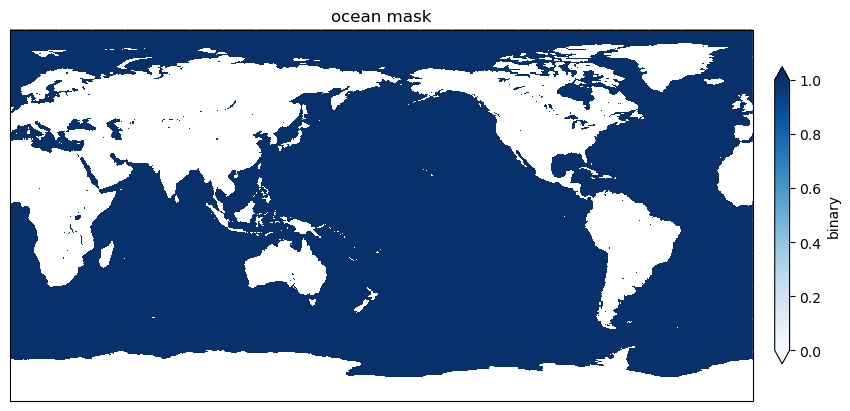

In [16]:
# check the mask:
fig, ax = plt.subplots(figsize=(12, 4),
                         subplot_kw={"projection": ccrs.PlateCarree(central_longitude=180)},
                         constrained_layout=True)

# Heat convergence
da = ocean_mask
im = ax.pcolormesh(da.longitude, da.latitude, da, 
                       cmap="Blues", vmin=0.0, vmax=1.0,
                       shading="auto",
                       transform=ccrs.PlateCarree())
# ax.coastlines(linewidth=0.7)
# ax.add_feature(cfeature.LAND, facecolor="lightgray", zorder=0)
ax.set_title("ocean mask")

cbar1 = fig.colorbar(im, ax=ax, orientation="vertical", pad=0.02, shrink=0.8, extend="both")
cbar1.set_label("binary")


## Estimate Stokes transport

In [5]:
# Estimate the Stokes transport (unit: m^2/s)
def estimate_stokes_transport(Hs, T, theta_from_deg):
    """
    theta_drom_deg: the raw ERA5 data are degrees that waves are coming FROM, 
    so zero means 'coming from the north' and 90 'coming from the east'.
    """
    # convert coming from to propagating toward
    theta = np.deg2rad((theta_from_deg + 180) % 360)

    Vs_mag = np.pi * Hs**2 / (8 * T)
    Vs_u = Vs_mag * np.sin(theta) # eastward
    Vs_v = Vs_mag * np.cos(theta) # northward

    return Vs_u, Vs_v

# global
# Wind wave (ww)
Vst_u_ww, Vst_v_ww = estimate_stokes_transport(wave_globe["shww"], wave_globe["mpww"], wave_globe["mdww"])
# Total Swells (ts)
Vst_u_ts, Vst_v_ts = estimate_stokes_transport(wave_globe["shts"], wave_globe["mpts"], wave_globe["mdts"])
# combine
Vst_u = Vst_u_ww + Vst_u_ts
Vst_v = Vst_v_ww + Vst_v_ts

### Stokes transport climatology

In [6]:
# calculate climatology
Vst_u_clim = Vst_u.mean(dim="time")
Vst_v_clim = Vst_v.mean(dim="time")


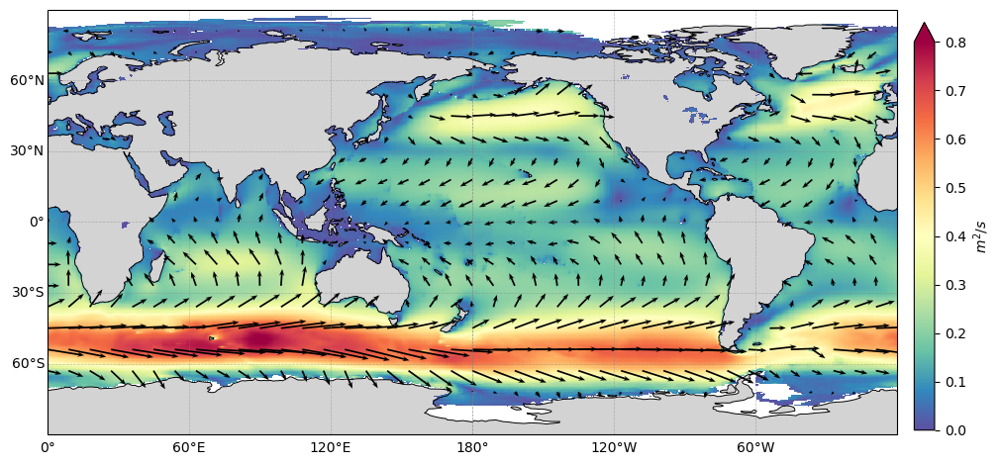

In [47]:
def plot_quiver(ax, u, v, title, skip=18):
    """
    ax   : matplotlib axis
    u,v  : x/y Stokes transport components (2D)
    title: subplot title
    skip : quiver subsampling
    """
    # magnitude for background color
    mag = np.sqrt(u**2 + v**2)
    
    # plot magnitude as background
    im = ax.pcolormesh(u["longitude"], u["latitude"],mag,
                       vmin=0.0, vmax=0.8,
                       cmap="Spectral_r",
                       transform=ccrs.PlateCarree()
    )
    # quiver arrows
    ax.quiver(u["longitude"].values[::skip], u["latitude"].values[::skip],
              u.values[::skip, ::skip], v.values[::skip, ::skip], 
              scale=13, color="k", transform=ccrs.PlateCarree(),
              headwidth=3, width=0.002,
              headlength=4,
              headaxislength=3
    )
    # ax.set_title(title, fontsize=14)
    ax.coastlines(linewidth=0.7)
    ax.add_feature(cfeature.LAND, facecolor="lightgray", zorder=0)
    # remove the gridline lables on the right and top
    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray',
                  alpha=0.5, linestyle='--')
    gl.right_labels = False
    gl.top_labels = False
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    
    return im  # for colorbar


# plotting
fig, ax = plt.subplots(
    figsize=(10, 6),
    subplot_kw={"projection": ccrs.PlateCarree(central_longitude=180)},
    constrained_layout=True
)

im0 = plot_quiver(ax, Vst_u_clim, Vst_v_clim, f"Estimated Climatological Stokes Transport $\\mathbf{{U}}_{{st}}$")
cbar = fig.colorbar(im0, ax=ax,orientation="vertical", label=f"$m^2/s$", pad = 0.02, fraction=0.024, extend="max")
save_path = "/home/m/m301254/project_surfwaves/figs/era5_Stokes_transport"
plt.savefig(f"{save_path}/Estimated_Stokes_transport_Total_clima.png", dpi=150 ,bbox_inches="tight")
plt.show()

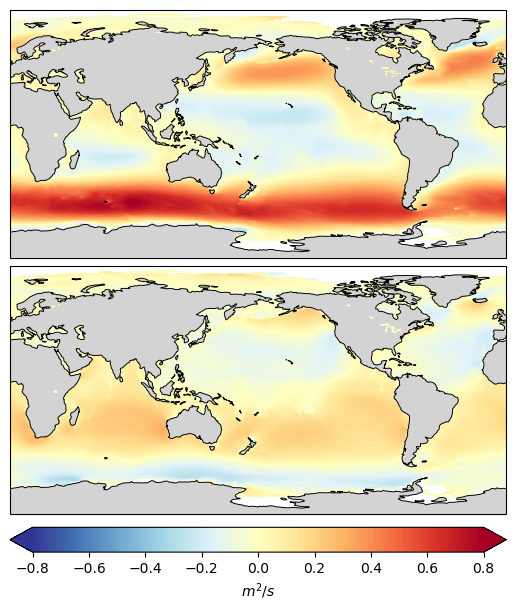

In [ ]:
fig, axes = plt.subplots(2,1,
    figsize=(8, 6),
    subplot_kw={"projection": ccrs.PlateCarree(central_longitude=180)},
    constrained_layout=True
)

im0 = axes[0].pcolormesh(Vst_u_clim["longitude"], Vst_u_clim["latitude"], Vst_u_clim,
                       vmin=-0.8, vmax=0.8,
                       cmap="RdYlBu_r",
                       transform=ccrs.PlateCarree()
)
axes[0].coastlines(linewidth=0.7)
axes[0].add_feature(cfeature.LAND, facecolor="lightgray", zorder=0)
im1 = axes[1].pcolormesh(Vst_v_clim["longitude"], Vst_v_clim["latitude"], Vst_v_clim,
                       vmin=-0.8, vmax=0.8,
                       cmap="RdYlBu_r",
                       transform=ccrs.PlateCarree()
)
axes[1].coastlines(linewidth=0.7)
axes[1].add_feature(cfeature.LAND, facecolor="lightgray", zorder=0)
cbar = fig.colorbar(im1, ax=axes[1],orientation="horizontal", label=f"$m^2/s$", pad = 0.05, fraction=0.08,extend="both", shrink=0.8)

### Stokes transport along equator

In [16]:
# select the Vst_v_clim along the equatorial region (-5 to 5 degree)
equatorial_mask = (Vst_v_clim.latitude >= -5) & (Vst_v_clim.latitude <= 5)
Vst_v_clim_equatorial = Vst_v_clim.where(equatorial_mask, drop=True)

# calculate the latitudinal mean to get the longitudial profile
Vst_v_clim_equatorial_mean = Vst_v_clim_equatorial.mean(dim="latitude")

In [24]:
Vst_v_clim_equatorial_mean

<xarray.DataArray (longitude: 720)> Size: 3kB
array([ 1.04564369e-01,  1.03847682e-01,  1.02996975e-01,  1.02007903e-01,
        1.00876465e-01,  9.96753797e-02,  9.83195528e-02,  9.68751088e-02,
        9.53171700e-02,  9.35054868e-02,  9.12281647e-02,  8.64443406e-02,
        8.28965753e-02,  7.98033178e-02,  7.55014494e-02,  7.36633465e-02,
        7.68566951e-02,  6.57202974e-02,  5.26943393e-02,  4.05431464e-02,
        7.50337020e-02,  7.29376078e-02,  6.78460598e-02,  6.24971315e-02,
        4.08497714e-02,             nan,             nan,             nan,
                   nan,             nan,             nan,             nan,
                   nan,             nan,             nan,             nan,
                   nan,             nan,             nan,             nan,
                   nan,             nan,             nan,             nan,
                   nan,             nan,             nan,             nan,
                   nan,             nan,             nan,             nan,
                   nan,             nan,             nan,             nan,
                   nan,             nan,             nan,             nan,
                   nan,             nan,             nan,             nan,
        2.55778572e-03,  3.52018280e-03,  3.29935225e-03,  1.86228636e-03,
        1.39437697e-03,  3.61774037e-05,             nan,             nan,
                   nan,             nan,             nan,             nan,
                   nan,             nan,             nan,  3.10023110e-02,
...
       -3.09757851e-02, -2.97494177e-02, -2.65606735e-02, -2.30394509e-02,
       -1.89972799e-02, -1.45369172e-02, -1.03305355e-02, -7.28630088e-03,
       -3.79339047e-03,  3.43826541e-05,  3.53304436e-03,  6.95311045e-03,
        9.77329724e-03,  1.21189132e-02,  1.44638903e-02,  1.66578554e-02,
        1.87437329e-02,  2.08320767e-02,  2.30439734e-02,  2.55059227e-02,
        2.83260681e-02,  3.14006880e-02,  3.45285423e-02,  3.73558849e-02,
        3.96300368e-02,  4.11910340e-02,  4.22927812e-02,  4.35630754e-02,
        4.56582606e-02,  4.88564111e-02,  5.32445461e-02,  5.84280305e-02,
        6.34630099e-02,  6.76535219e-02,  7.10883290e-02,  7.38885552e-02,
        7.65110627e-02,  7.92567357e-02,  8.24215785e-02,  8.57411548e-02,
        8.89649540e-02,  9.24331918e-02,  9.72135961e-02,  1.03351511e-01,
        1.08916521e-01,  1.13034293e-01,  1.15356311e-01,  1.16529830e-01,
        1.17078818e-01,  1.17388353e-01,  1.17678858e-01,  1.17860451e-01,
        1.17822923e-01,  1.17556535e-01,  1.17049806e-01,  1.16420045e-01,
        1.15640767e-01,  1.14465237e-01,  1.12742491e-01,  1.14606246e-01,
        1.16070986e-01,  1.13570333e-01,  1.13257721e-01,  1.13128997e-01,
        1.13176867e-01,  1.10188521e-01,  1.10279433e-01,  1.10005602e-01,
        1.09606721e-01,  1.08795993e-01,  1.07386626e-01,  1.09276772e-01,
        1.08351365e-01,  1.04597397e-01,  1.04304291e-01,  1.04922794e-01],
      dtype=float32)
Coordinates:
  * longitude          (longitude) float64 6kB 0.0 0.5 1.0 ... 358.5 359.0 359.5
    number             int64 8B 0
    step               timedelta64[ns] 8B 00:00:00
    meanSea            float64 8B 0.0
    heightAboveGround  float64 8B 10.0

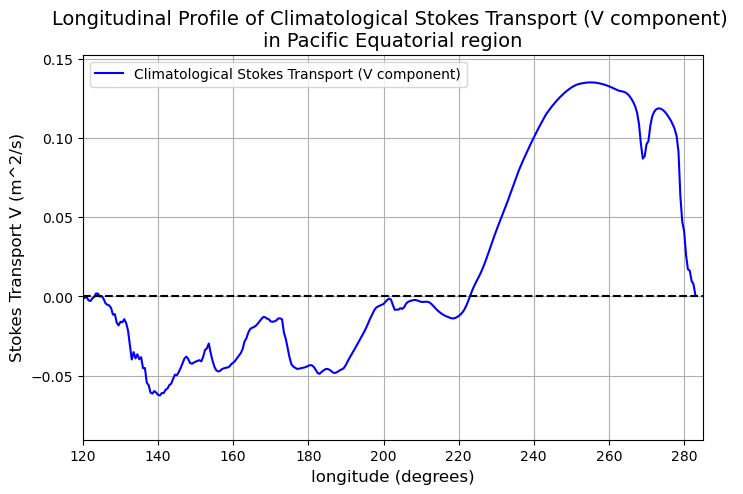

In [19]:
# plot the latitudinal profile
plt.figure(figsize=(8, 5))
plt.plot(Vst_v_clim_equatorial_mean.longitude, Vst_v_clim_equatorial_mean, label="Climatological Stokes Transport (V component)", color="b")
plt.axhline(0, color="k", linestyle="--", linewidth=1.5)
plt.xlim(120,285)
plt.xlabel("longitude (degrees)", fontsize=12)
plt.ylabel("Stokes Transport V (m^2/s)", fontsize=12)
plt.title("Longitudinal Profile of Climatological Stokes Transport (V component) \nin Pacific Equatorial region", fontsize=14)
plt.legend()
plt.grid()
# plt.savefig(f"{save_path}/Stokes_transport_V_component_equatorial_profile.png", dpi=150)
plt.show()

## Heat transport (HT) by Stokes transport
- $Q \approx \rho_w c_p \bar{V_{st}}(x,t)\bar{SST}(x,t)$

In [25]:
# heat transport: Q = rho * cp * Vst * T
rho_w = 1025     # unit: kg m-3
cp = 3985        # unit: J kg-1 K-1
sst_degC = sst_time - 273.15

# heat transport in both direction 
HT_u = rho_w * cp * Vst_u * sst_degC
HT_v = rho_w * cp * Vst_v * sst_degC
# diff components (ww, ts)
HT_u_ww = rho_w * cp * Vst_u_ww * sst_degC       # unit: J m-1 s-1 = W m-1 = HT (in Watt) per unit length
HT_v_ww = rho_w * cp * Vst_v_ww * sst_degC
HT_u_ts = rho_w * cp * Vst_u_ts * sst_degC
HT_v_ts = rho_w * cp * Vst_v_ts * sst_degC

## Mass transport (MT) by Stokes transport
- assumes the sea water shares the same density everywhere $M\approx \rho_w \bar{V_{st}}$

In [26]:
# mass transport in both direction
MT_u = rho_w * Vst_u
MT_v = rho_w * Vst_v
# diff components (ww, ts)
MT_u_ww = rho_w * Vst_u_ww       # unit: kg mT-1 s-1 = MT (in kg s-1) per unit length
MT_v_ww = rho_w * Vst_v_ww
MT_u_ts = rho_w * Vst_u_ts
MT_v_ts = rho_w * Vst_v_ts

## Divergence of transports
- Divergence of vector field $M$ in the spherical lat-lon coordinate: 
    - $\nabla \cdot M = \frac{1}{R\cos{\phi}}\frac{\partial M_{\lambda}}{\partial \lambda}+\frac{1}{R\cos{\phi}}\frac{\partial (M_{\phi}\cos{\phi})}{\partial \phi}$

### Function: Divergence on Spherical coords

In [27]:
# function to calculate the divergence of a vector field (u, v)
def divergence_spherical_global(M_u, M_v, R=6371000):
    """
    Compute divergence on a spherical lat-lon grid.

    Parameters:
    ---------
    M_u: (time, lat, lon) zonal component (eastward)
    M_v: (time, lat, lon) meridional component (northward)

    Returns:
    ---------
    div: (time, lat, lon) divergence field
    """
    # coordinates
    lat = M_u.latitude
    lat_rad = np.deg2rad(lat)
    coslat = xr.DataArray(np.cos(lat_rad),
                          coords={"latitude": lat},
                          dims=["latitude"], )
    deg2rad = np.pi / 180

    # periodic in longitude
    M_u_wrap = xr.concat([M_u.isel(longitude=-1), M_u, M_u.sel(longitude=0)], dim="longitude")
    lon_ext = xr.concat([M_u.longitude[-1:] - 360,
                         M_u.longitude,
                         M_u.longitude[:1] + 360,],
                         dim="longitude")
    M_u_wrap = M_u_wrap.assign_coords(longitude=lon_ext)

    # zonal derovative
    dMdlon = (M_u_wrap.differentiate("longitude").sel(longitude=M_u.longitude)* deg2rad)
    # meridional derivative
    dMdlat = ((M_v * coslat).differentiate("latitude")* deg2rad)

    # spherical divergence
    divM = (
        dMdlon / (R * coslat)
        + dMdlat / (R * coslat)
    )
    return -divM

### Divergence of Stokes transport

In [28]:
# removes poles
Vst_u = Vst_u.where(np.abs(Vst_u.latitude) < 89.5, drop=True)
Vst_v = Vst_v.where(np.abs(Vst_v.latitude) < 89.5, drop=True)
Vst_u_ww = Vst_u_ww.where(np.abs(Vst_u_ww.latitude) < 89.5, drop=True)
Vst_v_ww = Vst_v_ww.where(np.abs(Vst_v_ww.latitude) < 89.5, drop=True)
Vst_u_ts = Vst_u_ts.where(np.abs(Vst_u_ts.latitude) < 89.5, drop=True)
Vst_v_ts = Vst_v_ts.where(np.abs(Vst_v_ts.latitude) < 89.5, drop=True)

# Vst divergence
div_Vst = divergence_spherical_global(Vst_u, Vst_v)          # unit: W m-2 (Watt per unit area)
div_Vst_ww = divergence_spherical_global(Vst_u_ww, Vst_v_ww)
div_Vst_ts = divergence_spherical_global(Vst_u_ts, Vst_v_ts)   

### Divergence of heat/mass transport

In [29]:
# removes poles
HT_u = HT_u.where(np.abs(HT_u.latitude) < 89.5, drop=True)
HT_v = HT_v.where(np.abs(HT_v.latitude) < 89.5, drop=True)
HT_u_ww = HT_u_ww.where(np.abs(HT_u_ww.latitude) < 89.5, drop=True)
HT_v_ww = HT_v_ww.where(np.abs(HT_v_ww.latitude) < 89.5, drop=True)
HT_u_ts = HT_u_ts.where(np.abs(HT_u_ts.latitude) < 89.5, drop=True)
HT_v_ts = HT_v_ts.where(np.abs(HT_v_ts.latitude) < 89.5, drop=True)

MT_u = MT_u.where(np.abs(MT_u.latitude) < 89.5, drop=True)
MT_v = MT_v.where(np.abs(MT_v.latitude) < 89.5, drop=True)
MT_u_ww = MT_u_ww.where(np.abs(MT_u_ww.latitude) < 89.5, drop=True)
MT_v_ww = MT_v_ww.where(np.abs(MT_v_ww.latitude) < 89.5, drop=True)
MT_u_ts = MT_u_ts.where(np.abs(MT_u_ts.latitude) < 89.5, drop=True)
MT_v_ts = MT_v_ts.where(np.abs(MT_v_ts.latitude) < 89.5, drop=True)

# HT divergence
div_HT = divergence_spherical_global(HT_u, HT_v)          # unit: W m-2 (Watt per unit area)
div_HT_ww = divergence_spherical_global(HT_u_ww, HT_v_ww)
div_HT_ts = divergence_spherical_global(HT_u_ts, HT_v_ts)   

# MT divergence
div_MT = divergence_spherical_global(MT_u, MT_v)          # unit: kg s-1 m-2 (mass change per unit area)
div_MT_ww = divergence_spherical_global(MT_u_ww, MT_v_ww)
div_MT_ts = divergence_spherical_global(MT_u_ts, MT_v_ts)   

### Annual mean climatology

In [30]:
div_Vst_ann = div_Vst.mean(dim="time")
div_Vst_ww_ann = div_Vst_ww.mean(dim="time")
div_Vst_ts_ann = div_Vst_ts.mean(dim="time")

In [31]:
div_HT_ann = div_HT.mean(dim="time")
div_HT_ww_ann = div_HT_ww.mean(dim="time")
div_HT_ts_ann = div_HT_ts.mean(dim="time")

div_MT_ann = div_MT.mean(dim="time")
div_MT_ww_ann = div_MT_ww.mean(dim="time")
div_MT_ts_ann = div_MT_ts.mean(dim="time")

#### Function: plot divergence map panel

In [31]:
def plot_divergence_panel(ax, da, title, vmin, vmax, cmap="RdBu_r"):
    """
    Plot a single convergence panel
    
    Parameters:
    -------------
    ax: matplotlib axix
    da: 2D dataArray (lat, lon)
    title: subplot title
    """
    im = ax.pcolormesh(da.longitude, da.latitude, da, 
                       cmap=cmap, vmin=vmin, vmax=vmax, 
                       shading="auto",
                       transform=ccrs.PlateCarree())
    ax.coastlines(linewidth=0.7)
    ax.add_feature(cfeature.LAND, facecolor="lightgray", zorder=0)
    ax.set_title(title)
    # ax.gridlines(draw_labels=False, linewidth=0.3)
    return im

In [32]:
# determine colobar limits
vlim_HT = np.nanpercentile(
    np.abs(xr.concat([div_HT_ann, div_HT_ww_ann, div_HT_ts_ann], dim="z")),
    99,
)
vlim_MT = np.nanpercentile(
    np.abs(xr.concat([div_MT_ann, div_MT_ww_ann, div_MT_ts_ann], dim="z")),
    99,
)

vlim_HT = 1.2e-2
vlim_MT = 2e-7

(array([  114.,   131.,   176.,   157.,   199.,   258.,   288.,   347.,
          395.,   530.,   541.,   748.,   919.,  1183.,  1457.,  2082.,
         3439.,  4949.,  6478.,  8624., 10763., 12254., 12524., 10962.,
        14388., 18505., 10311.,  7087.,  5229.,  3351.,  2315.,  1582.,
         1155.,   702.,   567.,   465.,   354.,   293.,   224.,   211.,
          179.,   144.,   114.,   102.,   109.,   105.,    96.,    88.,
           78.,    69.]),
 array([-0.012  , -0.01152, -0.01104, -0.01056, -0.01008, -0.0096 ,
        -0.00912, -0.00864, -0.00816, -0.00768, -0.0072 , -0.00672,
        -0.00624, -0.00576, -0.00528, -0.0048 , -0.00432, -0.00384,
        -0.00336, -0.00288, -0.0024 , -0.00192, -0.00144, -0.00096,
        -0.00048,  0.     ,  0.00048,  0.00096,  0.00144,  0.00192,
         0.0024 ,  0.00288,  0.00336,  0.00384,  0.00432,  0.0048 ,
         0.00528,  0.00576,  0.00624,  0.00672,  0.0072 ,  0.00768,
         0.00816,  0.00864,  0.00912,  0.0096 ,  0.01008,  0.01056

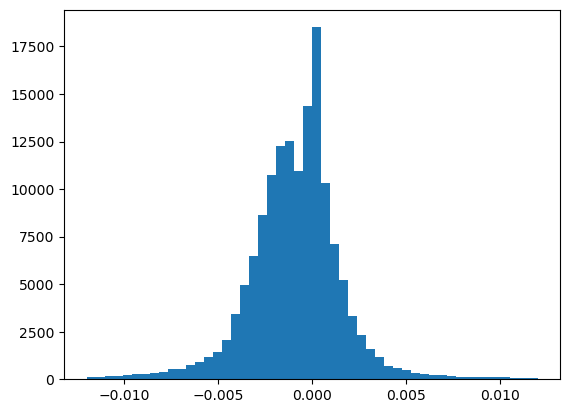

In [63]:
plt.hist(div_HT_ann.values.flatten(), bins=50, range=(-vlim_HT, vlim_HT))

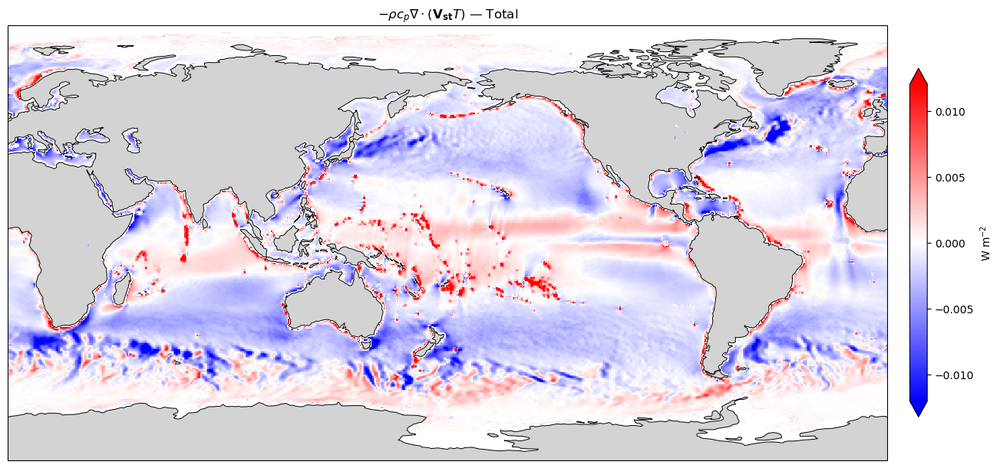

In [58]:
fig, ax = plt.subplots(figsize=(16, 6),
                         subplot_kw={"projection": ccrs.PlateCarree(central_longitude=180)},
                         constrained_layout=True)

# Heat convergence
im0 = plot_divergence_panel(ax, div_HT_ann, r"$-\rho c_p \nabla \cdot (\mathbf{V_{st}}T)$ — Total", -vlim_HT, vlim_HT, cmap="bwr")
cbar1 = fig.colorbar(im0, ax=ax, orientation="vertical", pad=0.02, shrink=0.8, extend="both")
cbar1.set_label("W m$^{-2}$")

(array([  103.,   138.,   168.,   212.,   273.,   292.,   447.,   482.,
          701.,   819.,  1033.,  1260.,  1590.,  1923.,  2331.,  2809.,
         3407.,  4261.,  6145.,  8935., 12007., 13859., 14560., 15338.,
        14695., 14465.,  9117.,  5706.,  3200.,  1825.,  1274.,  1089.,
          827.,   726.,   662.,   559.,   523.,   437.,   378.,   327.,
          285.,   273.,   251.,   234.,   163.,   163.,   151.,   154.,
          129.,   122.]),
 array([-2.00000000e-07, -1.92000000e-07, -1.84000000e-07, -1.76000000e-07,
        -1.68000000e-07, -1.60000000e-07, -1.52000000e-07, -1.44000000e-07,
        -1.36000000e-07, -1.28000000e-07, -1.20000000e-07, -1.12000000e-07,
        -1.04000000e-07, -9.60000000e-08, -8.80000000e-08, -8.00000000e-08,
        -7.20000000e-08, -6.40000000e-08, -5.60000000e-08, -4.80000000e-08,
        -4.00000000e-08, -3.20000000e-08, -2.40000000e-08, -1.60000000e-08,
        -8.00000000e-09, -2.64697796e-23,  8.00000000e-09,  1.60000000e-08,
         2

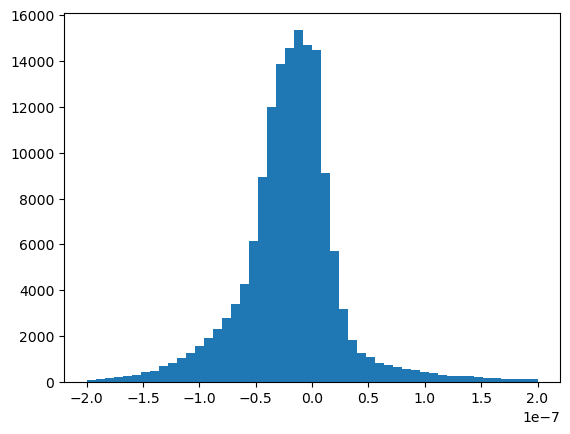

In [64]:
plt.hist(div_MT_ann.values.flatten(), bins=50, range=(-vlim_MT, vlim_MT))

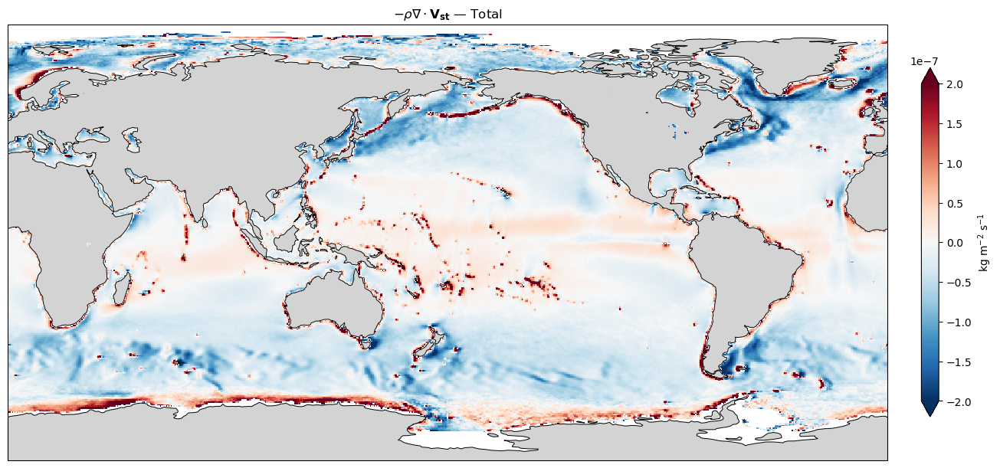

In [65]:
fig, ax = plt.subplots(figsize=(16, 6),
                         subplot_kw={"projection": ccrs.PlateCarree(central_longitude=180)},
                         constrained_layout=True)

# Heat convergence
im0 = plot_divergence_panel(ax, div_MT_ann, r"$-\rho \nabla \cdot \mathbf{V_{st}}$ — Total", -vlim_MT, vlim_MT, cmap="RdBu_r")
cbar1 = fig.colorbar(im0, ax=ax, orientation="vertical", pad=0.02, shrink=0.8, extend="both")
cbar1.set_label("kg m$^{-2}$ s$^{-1}$")

Text(0.5, 0.98, 'Stokes Drift Transport Convergence — Annual Mean (2000–2024)')

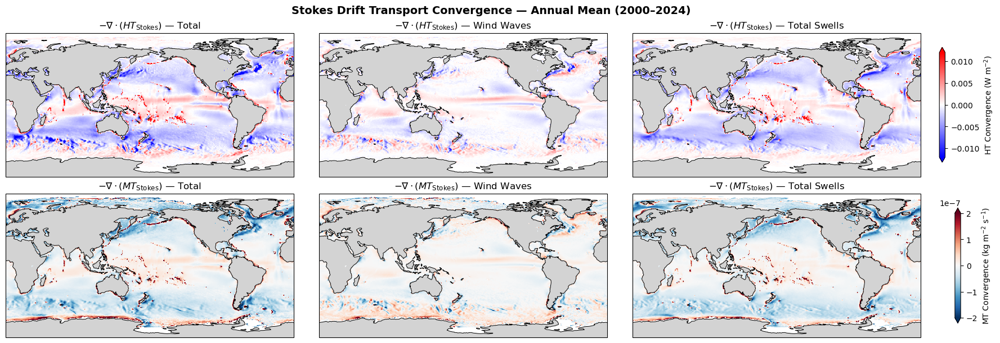

In [46]:
fig, axes = plt.subplots(2, 3, figsize=(18, 6),
                         subplot_kw={"projection": ccrs.PlateCarree(central_longitude=180)},
                         constrained_layout=True)

# Heat convergence
im0 = plot_divergence_panel(axes[0,0], div_HT_ann, r"$-\nabla \cdot (HT_{\text{Stokes}})$ — Total", -vlim_HT, vlim_HT, cmap="bwr")
plot_divergence_panel(axes[0,1], div_HT_ww_ann, r"$-\nabla \cdot (HT_{\text{Stokes}})$ — Wind Waves", -vlim_HT, vlim_HT, cmap="bwr")
plot_divergence_panel(axes[0,2], div_HT_ts_ann, r"$-\nabla \cdot (HT_{\text{Stokes}})$ — Total Swells", -vlim_HT, vlim_HT, cmap="bwr")

cbar1 = fig.colorbar(im0, ax=axes[0,:], orientation="vertical", pad=0.02, shrink=0.8, extend="both")
cbar1.set_label("HT Convergence (W m$^{-2}$)")


# Mass convergence
im1 = plot_divergence_panel(axes[1,0], div_MT_ann, r"$-\nabla \cdot (MT_{\text{Stokes}})$ — Total", -vlim_MT, vlim_MT)
plot_divergence_panel(axes[1,1], div_MT_ww_ann, r"$-\nabla \cdot (MT_{\text{Stokes}})$ — Wind Waves", -vlim_MT, vlim_MT)
plot_divergence_panel(axes[1,2], div_MT_ts_ann, r"$-\nabla \cdot (MT_{\text{Stokes}})$ — Total Swells", -vlim_MT, vlim_MT)

cbar2 = fig.colorbar(im1, ax=axes[1,:], orientation="vertical", pad=0.02, shrink=0.8, extend="both")
cbar2.set_label("MT Convergence (kg m$^{-2}$ s$^{-1}$)")

fig.suptitle(
    "Stokes Drift Transport Convergence — Annual Mean (2000–2024)",
    fontsize=14, fontweight="bold"
)

### Integral of divergence field

In [28]:
div_MT_ann

<xarray.DataArray (latitude: 361, longitude: 720)> Size: 2MB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], shape=(361, 720))
Coordinates:
  * latitude           (latitude) float64 3kB 90.0 89.5 89.0 ... -89.5 -90.0
  * longitude          (longitude) float64 6kB 0.0 0.5 1.0 ... 358.5 359.0 359.5
    number             int64 8B 0
    step               timedelta64[ns] 8B 00:00:00
    meanSea            float64 8B 0.0
    heightAboveGround  float64 8B 10.0

#### Function: integrate mass convergence

In [32]:
def global_integral_mass_convergence(divM, R=6371000):
    """
    Compute the global integral of a mass convergence field on a lat-lon grid.

    Parameters
    ----------
    divM : xarray.DataArray
        Mass convergence field (kg m-2 s-1) with dims (lat, lon) or (time, lat, lon)

    R : float
        Earth radius (m)

    Returns
    -------
    integral : float or DataArray
        Global integral of mass convergence (kg s-1)
    """

    # convert coordinates
    lat_rad = np.deg2rad(divM.latitude)
    lon_rad = np.deg2rad(divM.longitude)

    # grid spacing
    dlat = np.abs(lat_rad[1] - lat_rad[0])
    dlon = np.abs(lon_rad[1] - lon_rad[0])

    # latitude weighting
    coslat = xr.DataArray(
        np.cos(lat_rad),
        coords={"latitude": divM.latitude},
        dims=["latitude"]
    )

    # grid cell area
    area = (R**2) * coslat * dlat * dlon

    # broadcast area to data
    area = area.broadcast_like(divM)

    # integrate
    integral = (divM * area).sum(dim=("latitude", "longitude"), skipna=True)

    return integral

In [33]:
lat_rad = np.deg2rad(div_MT_ann.latitude)
coslat = xr.DataArray(np.cos(lat_rad), coords={"latitude":div_MT_ann.latitude}, dims=["latitude"])

area_weighted_mean = div_MT_ann.weighted(coslat).mean(("latitude","longitude"))

print(area_weighted_mean.values)

-1.2088241737445379e-08


In [34]:
div_MT_ann_correct = - div_MT_ann # convergence to divergence
global_int = global_integral_mass_convergence(div_MT_ann_correct)
total_abs = global_integral_mass_convergence(np.abs(div_MT_ann_correct))
R = abs(global_int) / total_abs
print("Total waves (ww+ ts):")
print("Global integral:", global_int.values, "kg s-1")
print("Relative imbalance:", R.values)

print("---------------------------------------")
div_MT_ts_ann_correct = - div_MT_ts_ann
global_int = global_integral_mass_convergence(div_MT_ts_ann_correct)
total_abs = global_integral_mass_convergence(np.abs(div_MT_ts_ann_correct))
R = abs(global_int) / total_abs
print("Total swells:")
print("Global integral:", global_int.values, "kg s-1")
print("Relative imbalance:", R.values)

print("---------------------------------------")
div_MT_ww_ann_correct = - div_MT_ww_ann
global_int = global_integral_mass_convergence(div_MT_ww_ann_correct)
total_abs = global_integral_mass_convergence(np.abs(div_MT_ww_ann_correct))
R = abs(global_int) / total_abs
print("Wind waves:")
print("Global integral:", global_int.values, "kg s-1")
print("Relative imbalance:", R.values)

print("---------------------------------------")
div_Vst_ann_correct = - div_Vst_ann
global_int = global_integral_mass_convergence(div_Vst_ann_correct)
total_abs = global_integral_mass_convergence(np.abs(div_Vst_ann_correct))
R = abs(global_int) / total_abs
print("Vst")
print("Global integral:", global_int.values, "m3 s-1")
print("Relative imbalance:", R.values)

Total waves (ww+ ts):
Global integral: 4189651.1014713524 kg s-1
Relative imbalance: 0.35824460450066886
---------------------------------------
Total swells:
Global integral: 4034415.7019340703 kg s-1
Relative imbalance: 0.40881640417708465
---------------------------------------
Wind waves:
Global integral: 155235.3998474999 kg s-1
Relative imbalance: 0.03008011114351138
---------------------------------------
Vst
Global integral: 4087.464489984396 m3 s-1
Relative imbalance: 0.35824460452778534


### Net Stokes transport divergence in Equatorial Pacific region (120E to 75W, 5S to 5N)

In [46]:
div_Vst_ann_reg = div_Vst_ann.sel(latitude=slice(5, -5), longitude=slice(120, 285))
div_Vst_ann_reg_correct = -div_Vst_ann_reg
Eq_int = global_integral_mass_convergence(div_Vst_ann_reg_correct)
total_abs = global_integral_mass_convergence(np.abs(div_Vst_ann_reg_correct))
R = abs(Eq_int) / total_abs
print("Total waves (ww+ ts):")
print("Equatorial Pacific integral:", Eq_int.values, "m3 s-1")
print("Relative imbalance:", R.values)

Total waves (ww+ ts):
Equatorial Pacific integral: -236.2556652637921 m3 s-1
Relative imbalance: 0.7906450460300298


### Net Stokes transport divergence in Pacific region

In [56]:
# select region: Indo-Pacific
lon = wave_globe.longitude
lat = wave_globe.latitude

mask_IP = (
    (lat <= 60) & (lat >= -60) &                         # latitude band
    (lon >= 35) & (lon <= 290) &                         # Indo-Pacific sector
    ~((lon >= 263) & (lon <= 290) & (lat >= 20)) &       # remove Atlantic near North America
    ~((lat >= 10) & (lon >= 270) & (lon <= 290))
)

wave_IP = wave_globe.where(mask_IP)
sst_IP  = sst_time.where(mask_IP)

def get_basin_mask(lat, lon, basin_name="Indo-Pacific"):
    """
    Return a rough mask (True for points inside the basin) for the given basin.

    lat: xarray.DataArray of latitude
    lon: xarray.DataArray of longitude
    basin_name: str, one of ["Indo-Pacific", "Atlantic", "Indian", "Pacific"]
    """
    # Latitude band
    lat_mask = (lat >= -80) & (lat <= 65)

    # Longitude masks
    if basin_name == "Indo-Pacific":
        # Rough: 35E → 290E
        lon_mask = (lon >= 35) & (lon <= 290)
        # Remove small Atlantic wedges
        lon_mask = lon_mask & ~((lon >= 263) & (lon <= 290) & (lat >= 20))
        lon_mask = lon_mask & ~((lat >= 10) & (lon >= 270) & (lon <= 290))

    elif basin_name == "Atlantic":
        # Basically the complement of Indo-Pacific with Atlantic corrections
        lon_mask = ~((lon >= 35) & (lon <= 290))
        # Add wedges corresponding to North Atlantic region
        lon_mask = lon_mask | (((lon >= 263) & (lon <= 290) & (lat >= 20)))
        lon_mask = lon_mask | (((lat >= 10) & (lon >= 270) & (lon <= 290)))

    elif basin_name == "Indian":
        lon_mask = (lon >= 35) & (lon <= 120)

    elif basin_name == "Pacific":
        lon_mask = (lon >= 120) & (lon <= 290)
        # Remove small Atlantic wedges
        lon_mask = lon_mask & ~((lon >= 263) & (lon <= 290) & (lat >= 20))
        lon_mask = lon_mask & ~((lat >= 10) & (lon >= 270) & (lon <= 290))

    else:
        raise ValueError(f"Unknown basin_name: {basin_name}")

    # Broadcast lat & lon to 2D mask
    mask_2d = lat_mask & lon_mask
    return mask_2d

mask_AT = get_basin_mask(lat, lon, basin_name="Atlantic")
mask_ID = get_basin_mask(lat, lon, basin_name="Indian")
mask_PA = get_basin_mask(lat, lon, basin_name="Pacific")

Text(0.5, 1.0, 'Indo-Pacific')

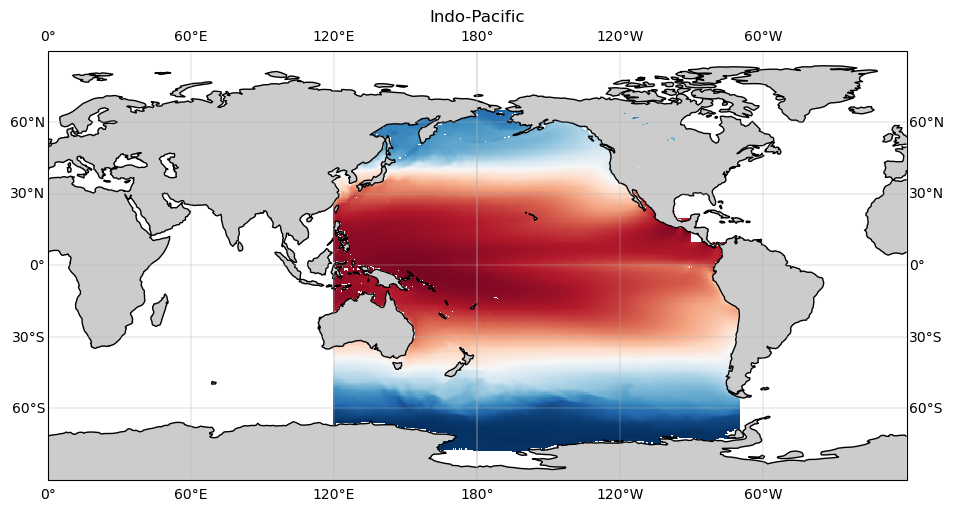

In [57]:
sst_masked = sst_time.where(mask_PA)
mean_ht = sst_masked.mean(dim="time")
fig, ax = plt.subplots(1,1, figsize=(12, 5), subplot_kw={"projection": ccrs.PlateCarree(central_longitude=180)}, constrained_layout=True)
pcm = ax.pcolormesh(
        mean_ht.longitude, mean_ht.latitude, mean_ht,
        # vmin=-1e-4, vmax=1e-4,
        shading='auto', cmap='RdBu_r', transform=ccrs.PlateCarree()
)

# ax.set_title(title, fontsize=14)
ax.coastlines()
ax.add_feature(cfeature.LAND, facecolor="0.8", zorder=0)
ax.gridlines(draw_labels=True, linewidth=0.3)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_title("Indo-Pacific")

In [59]:
div_Vst_ann_reg = div_Vst_ann.where(mask_PA, drop=True)
div_Vst_ann_reg_correct = -div_Vst_ann_reg
Eq_int = global_integral_mass_convergence(div_Vst_ann_reg_correct)
total_abs = global_integral_mass_convergence(np.abs(div_Vst_ann_reg_correct))
R = abs(Eq_int) / total_abs
print("Total waves (ww+ ts):")
print("Pacific integral:", Eq_int.values, "m3 s-1")
print("Relative imbalance:", R.values)

print("---------------------------------------")
div_Vst_ts_ann_reg = div_Vst_ts_ann.where(mask_PA, drop=True)
div_Vst_ts_ann_correct = - div_Vst_ts_ann_reg
global_int = global_integral_mass_convergence(div_Vst_ts_ann_correct)
total_abs = global_integral_mass_convergence(np.abs(div_Vst_ts_ann_correct))
R = abs(global_int) / total_abs
print("Total swells:")
print("Pacific integral:", global_int.values, "kg s-1")
print("Relative imbalance:", R.values)

print("---------------------------------------")
div_Vst_ww_ann_reg = div_Vst_ww_ann.where(mask_PA, drop=True)
div_Vst_ww_ann_correct = - div_Vst_ww_ann_reg
global_int = global_integral_mass_convergence(div_Vst_ww_ann_correct)
total_abs = global_integral_mass_convergence(np.abs(div_Vst_ww_ann_correct))
R = abs(global_int) / total_abs
print("Wind waves:")
print("Pacific integral:", global_int.values, "kg s-1")
print("Relative imbalance:", R.values)


Total waves (ww+ ts):
Pacific integral: 1276.820360596589 m3 s-1
Relative imbalance: 0.2358852950412687
---------------------------------------
Total swells:
Pacific integral: 1353.2849476877666 kg s-1
Relative imbalance: 0.29612651345667784
---------------------------------------
Wind waves:
Pacific integral: -76.46458704126492 kg s-1
Relative imbalance: 0.03613799658533715


### Monthly mean climatology
- two seasons are selected based on the climatological cross-Equatorial Stokes heat transport:
    - JJA
    - DJF

In [102]:
# June-July-August (JJA) mean
div_HT_JJA = div_HT.sel(time=div_HT.time.dt.season == "JJA", drop=True).mean(dim="time")
div_HT_ww_JJA = div_HT_ww.sel(time=div_HT.time.dt.season == "JJA", drop=True).mean(dim="time")
div_HT_ts_JJA = div_HT_ts.sel(time=div_HT.time.dt.season == "JJA", drop=True).mean(dim="time")

div_MT_JJA = div_MT.sel(time=div_HT.time.dt.season == "JJA", drop=True).mean(dim="time")
div_MT_ww_JJA = div_MT_ww.sel(time=div_HT.time.dt.season == "JJA", drop=True).mean(dim="time")
div_MT_ts_JJA = div_MT_ts.sel(time=div_HT.time.dt.season == "JJA", drop=True).mean(dim="time")

# December-January-February (DJF) mean
div_HT_DJF = div_HT.sel(time=div_HT.time.dt.season == "DJF", drop=True).mean(dim="time")
div_HT_ww_DJF = div_HT_ww.sel(time=div_HT.time.dt.season == "DJF", drop=True).mean(dim="time")
div_HT_ts_DJF = div_HT_ts.sel(time=div_HT.time.dt.season == "DJF", drop=True).mean(dim="time")

div_MT_DJF = div_MT.sel(time=div_HT.time.dt.season == "DJF", drop=True).mean(dim="time")
div_MT_ww_DJF = div_MT_ww.sel(time=div_HT.time.dt.season == "DJF", drop=True).mean(dim="time")
div_MT_ts_DJF = div_MT_ts.sel(time=div_HT.time.dt.season == "DJF", drop=True).mean(dim="time")

Text(0.5, 0.98, 'Stokes Drift Transport Convergence — JJA Mean (2000–2024)')

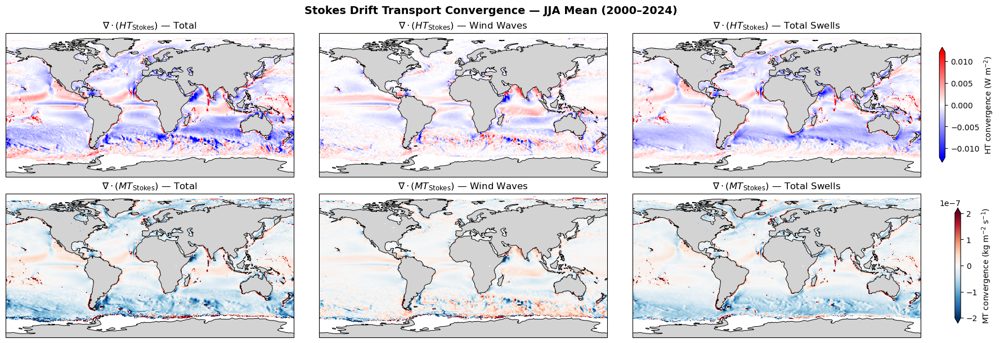

In [103]:
fig, axes = plt.subplots(2, 3, figsize=(18, 6),
                         subplot_kw={"projection": ccrs.PlateCarree()},
                         constrained_layout=True)

# Heat convergence
im0 = plot_divergence_panel(axes[0,0], div_HT_JJA, r"$\nabla \cdot (HT_{\text{Stokes}})$ — Total", -vlim_HT, vlim_HT, cmap="bwr")
plot_divergence_panel(axes[0,1], div_HT_ww_JJA, r"$\nabla \cdot (HT_{\text{Stokes}})$ — Wind Waves", -vlim_HT, vlim_HT, cmap="bwr")
plot_divergence_panel(axes[0,2], div_HT_ts_JJA, r"$\nabla \cdot (HT_{\text{Stokes}})$ — Total Swells", -vlim_HT, vlim_HT, cmap="bwr")

cbar1 = fig.colorbar(im0, ax=axes[0,:], orientation="vertical", pad=0.02, shrink=0.8, extend="both")
cbar1.set_label("HT convergence (W m$^{-2}$)")


# Mass convergence
im1 = plot_divergence_panel(axes[1,0], div_MT_JJA, r"$\nabla \cdot (MT_{\text{Stokes}})$ — Total", -vlim_MT, vlim_MT)
plot_divergence_panel(axes[1,1], div_MT_ww_JJA, r"$\nabla \cdot (MT_{\text{Stokes}})$ — Wind Waves", -vlim_MT, vlim_MT)
plot_divergence_panel(axes[1,2], div_MT_ts_JJA, r"$\nabla \cdot (MT_{\text{Stokes}})$ — Total Swells", -vlim_MT, vlim_MT)

cbar2 = fig.colorbar(im1, ax=axes[1,:], orientation="vertical", pad=0.02, shrink=0.8, extend="both")
cbar2.set_label("MT convergence (kg m$^{-2}$ s$^{-1}$)")

fig.suptitle(
    "Stokes Drift Transport Convergence — JJA Mean (2000–2024)",
    fontsize=14, fontweight="bold"
)

Text(0.5, 0.98, 'Stokes Drift Transport Convergence — DJF Mean (2000–2024)')

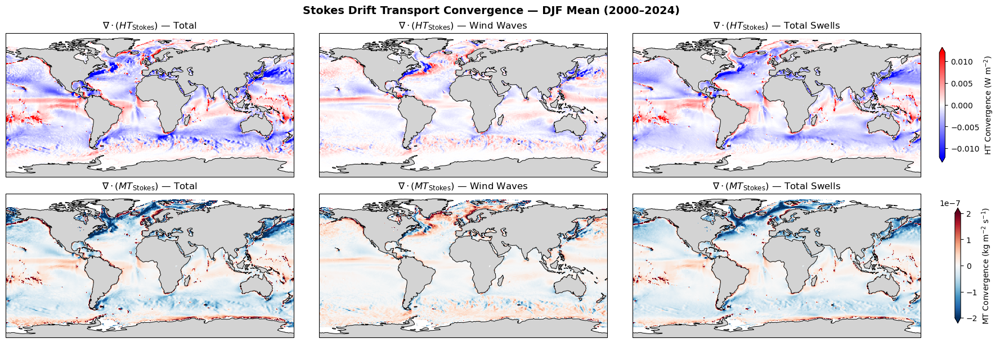

In [104]:
fig, axes = plt.subplots(2, 3, figsize=(18, 6),
                         subplot_kw={"projection": ccrs.PlateCarree()},
                         constrained_layout=True)

# Heat convergence
im0 = plot_divergence_panel(axes[0,0], div_HT_DJF, r"$\nabla \cdot (HT_{\text{Stokes}})$ — Total", -vlim_HT, vlim_HT, cmap="bwr")
plot_divergence_panel(axes[0,1], div_HT_ww_DJF, r"$\nabla \cdot (HT_{\text{Stokes}})$ — Wind Waves", -vlim_HT, vlim_HT, cmap="bwr")
plot_divergence_panel(axes[0,2], div_HT_ts_DJF, r"$\nabla \cdot (HT_{\text{Stokes}})$ — Total Swells", -vlim_HT, vlim_HT, cmap="bwr")

cbar1 = fig.colorbar(im0, ax=axes[0,:], orientation="vertical", pad=0.02, shrink=0.8, extend="both")
cbar1.set_label("HT Convergence (W m$^{-2}$)")


# Mass convergence
im1 = plot_divergence_panel(axes[1,0], div_MT_DJF, r"$\nabla \cdot (MT_{\text{Stokes}})$ — Total", -vlim_MT, vlim_MT)
plot_divergence_panel(axes[1,1], div_MT_ww_DJF, r"$\nabla \cdot (MT_{\text{Stokes}})$ — Wind Waves", -vlim_MT, vlim_MT)
plot_divergence_panel(axes[1,2], div_MT_ts_DJF, r"$\nabla \cdot (MT_{\text{Stokes}})$ — Total Swells", -vlim_MT, vlim_MT)

cbar2 = fig.colorbar(im1, ax=axes[1,:], orientation="vertical", pad=0.02, shrink=0.8, extend="both")
cbar2.set_label("MT Convergence (kg m$^{-2}$ s$^{-1}$)")

fig.suptitle(
    "Stokes Drift Transport Convergence — DJF Mean (2000–2024)",
    fontsize=14, fontweight="bold"
)

### Seasonality: compare

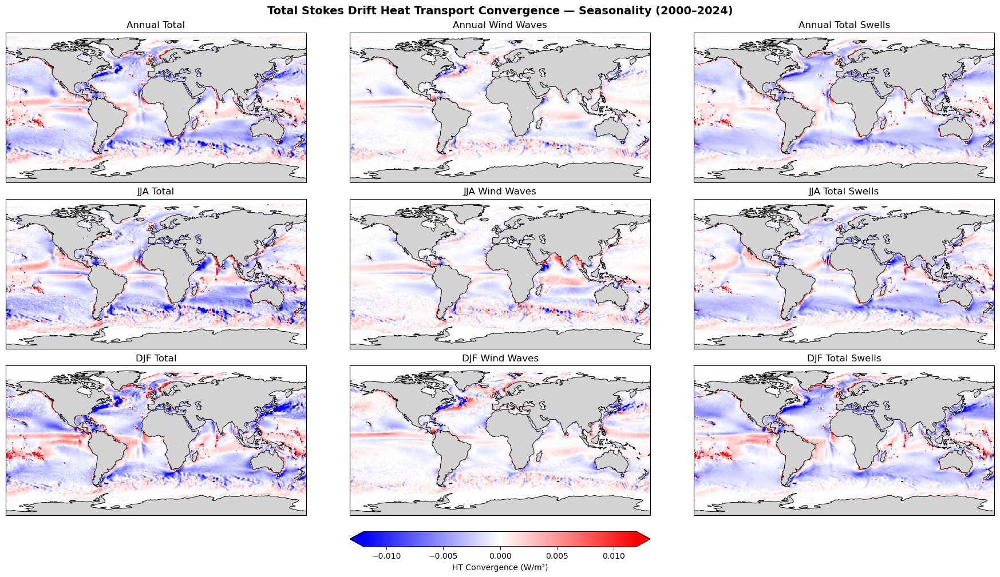

In [105]:
fig, axes = plt.subplots(
    nrows=3, ncols=3, figsize=(18, 10),
    constrained_layout=True,
    subplot_kw={'projection': ccrs.PlateCarree()}
)

im0 = plot_divergence_panel(axes[0,0], div_HT_ann, r"Annual Total", -vlim_HT, vlim_HT, cmap="bwr")
plot_divergence_panel(axes[1,0], div_HT_JJA, r"JJA Total", -vlim_HT, vlim_HT, cmap="bwr")
plot_divergence_panel(axes[2,0], div_HT_DJF, r"DJF Total", -vlim_HT, vlim_HT, cmap="bwr")


im1 = plot_divergence_panel(axes[0,1], div_HT_ww_ann, r"Annual Wind Waves", -vlim_HT, vlim_HT, cmap="bwr")
plot_divergence_panel(axes[1,1], div_HT_ww_JJA, r"JJA Wind Waves", -vlim_HT, vlim_HT, cmap="bwr")
plot_divergence_panel(axes[2,1], div_HT_ww_DJF, r"DJF Wind Waves", -vlim_HT, vlim_HT, cmap="bwr")

im2 = plot_divergence_panel(axes[0,2], div_HT_ts_ann, r"Annual Total Swells", -vlim_HT, vlim_HT, cmap="bwr")
plot_divergence_panel(axes[1,2], div_HT_ts_JJA, r"JJA Total Swells", -vlim_HT, vlim_HT, cmap="bwr")
plot_divergence_panel(axes[2,2], div_HT_ts_DJF, r"DJF Total Swells", -vlim_HT, vlim_HT, cmap="bwr")

# --- shared colorbars per row ---
cbar0 = fig.colorbar(im0, ax=axes[2,:], orientation="horizontal", pad=0.1, fraction=0.1, extend="both", label="HT Convergence (W/m²)")

fig.suptitle(
    "Total Stokes Drift Heat Transport Convergence — Seasonality (2000–2024)",
    fontsize=14, fontweight="bold"
)

plt.show()

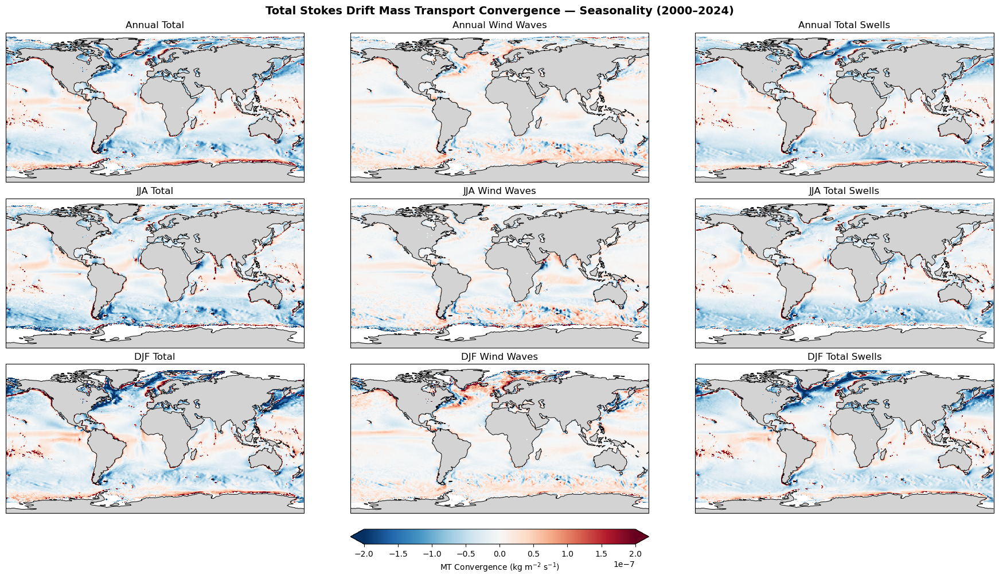

In [106]:
fig, axes = plt.subplots(
    nrows=3, ncols=3, figsize=(18, 10),
    constrained_layout=True,
    subplot_kw={'projection': ccrs.PlateCarree()}
)

im0 = plot_divergence_panel(axes[0,0], div_MT_ann, r"Annual Total", -vlim_MT, vlim_MT)
plot_divergence_panel(axes[1,0], div_MT_JJA, r"JJA Total", -vlim_MT, vlim_MT)
plot_divergence_panel(axes[2,0], div_MT_DJF, r"DJF Total", -vlim_MT, vlim_MT)


im1 = plot_divergence_panel(axes[0,1], div_MT_ww_ann, r"Annual Wind Waves", -vlim_MT, vlim_MT)
plot_divergence_panel(axes[1,1], div_MT_ww_JJA, r"JJA Wind Waves", -vlim_MT, vlim_MT)
plot_divergence_panel(axes[2,1], div_MT_ww_DJF, r"DJF Wind Waves", -vlim_MT, vlim_MT)

im2 = plot_divergence_panel(axes[0,2], div_MT_ts_ann, r"Annual Total Swells", -vlim_MT, vlim_MT)
plot_divergence_panel(axes[1,2], div_MT_ts_JJA, r"JJA Total Swells", -vlim_MT, vlim_MT)
plot_divergence_panel(axes[2,2], div_MT_ts_DJF, r"DJF Total Swells", -vlim_MT, vlim_MT)

# --- shared colorbars per row ---
cbar0 = fig.colorbar(im0, ax=axes[2,:], orientation="horizontal", pad=0.1, fraction=0.1, extend="both", label="MT Convergence (kg m$^{-2}$ s$^{-1}$)")

fig.suptitle(
    "Total Stokes Drift Mass Transport Convergence — Seasonality (2000–2024)",
    fontsize=14, fontweight="bold"
)

plt.show()